# Advection 1D

Построим график зависимости норм ошибки от кол-ва узлов сетки. Сравнивать будем численное и теоретическое решения при $T=1.0$

end of reading


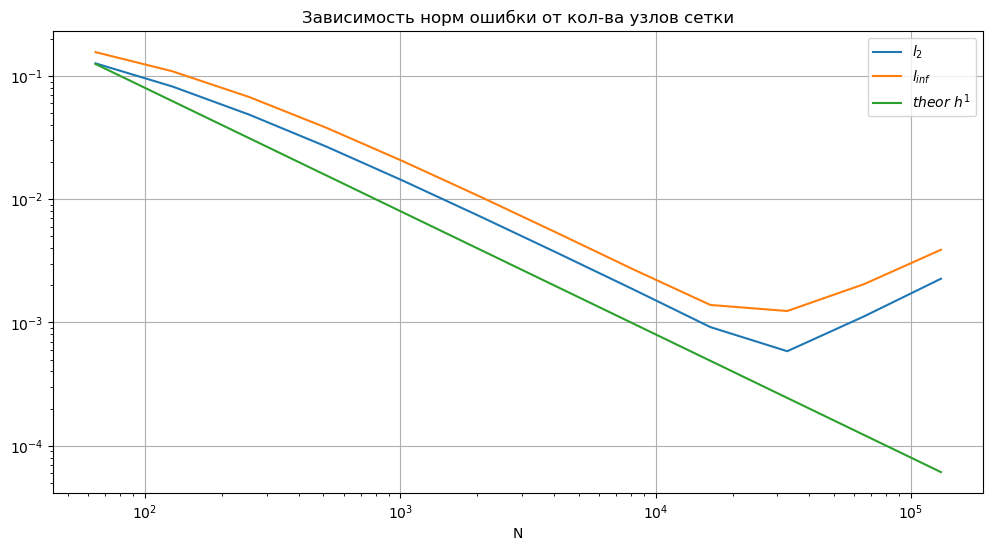

In [19]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['animation.embed_limit'] = 2**128


def read(filename):
    with open(f"../TextFiles/{filename}.bin", 'r') as file:
        n=np.fromfile(file,count=1,dtype=np.int32)[0]
        N = np.fromfile(file,count=n,dtype=np.float32)
        l = np.fromfile(file,count=n,dtype=np.float32)
        
    return N,l,n


N,l_2,n=read("advection1D_l2norm")
N,l_inf,n=read("advection1D_linfnorm")
print("end of reading")

plt.figure(figsize=(12,6))
plt.loglog(N,l_2,label=r"$l_2$")
plt.loglog(N,l_inf,label=r"$l_{inf}$")
plt.loglog(N,8/N,label=r"$theor\,\, h^1$")

plt.legend(loc='best')
plt.title("Зависимость норм ошибки от кол-ва узлов сетки")
plt.xlabel("N")

plt.grid()

Как видно, скорость роста точности примерно $h^1$

При $N>2^{14}$ данная схема начинает ломаться от ошибок окргуления

# Advection 2D

## Начальное условие - матрица, где левее середины находятся нули, правее единицы

In [20]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import animation
from IPython.display import HTML
import seaborn
plt.rcParams['animation.embed_limit'] = 2**128


def read(filename):
    #x=[]
    with open(f"../TextFiles/{filename}.bin", 'r') as file:
        NM=np.fromfile(file,count=2,dtype=np.int32)
        x = np.fromfile(file,dtype=np.float32)
        nt,nx=NM[0],NM[1]
    return x,nx,nt

def sum_(arr):
    sum=0
    for i in range(1,len(arr)):
        for j in range(1,len(arr[0])):
            sum+=arr[i,j]
    return sum

def animateAdvection(u, x,y, t, animSpeed = 1):   
    X, Y = np.meshgrid(x, y)
    fig = plt.figure()
    seaborn.heatmap(u[0,:])
    plt.axis("off")
    fig.tight_layout()
    fig.subplots_adjust(bottom=0.15)
   
    def animate(n):
        plt.clf()
        nAnim = animSpeed * n
        seaborn.heatmap(u[nAnim,:],vmax=1)
        plt.axis("off")


    anim = animation.FuncAnimation(fig, animate, frames=len(t), interval=1, repeat = False, blit=False)
    return anim

C,nx,nt=read("advection2D_hulfzero")
print("end of reaading")
nx=int(np.sqrt(nx))

arr=np.zeros((nt,nx,nx))
for t in range(nt):
    for y in range(nx):
        for x in range(nx):
            arr[t][y][x]=C[t*nx*nx+y*nx+x]
#print(C)

t=np.linspace(0,1,nt)
x=np.linspace(0,1,nx)
y=np.linspace(0,1,nx)

#anim = animateAdvection(arr, x,y, t)
#HTML(anim.to_jshtml())

end of reaading


In [21]:
sum_exact=sum_(arr[0])
for j in range(len(arr)):
    print(sum_(arr[j])-sum_exact) 

0.0
-1.5336950146440813
-3.0298863483837977
-4.492904584389635
-5.923901888094633
-7.323996611422444
-8.694252728887932
-10.035716548744176
-11.349366497062874
-12.636159121793753
-13.897016226435653
-15.132826447052594
-16.344437666976773
-17.532668612456746
-18.69830969564714
-19.842107097970256
-20.964784861971793
-22.067049971445158
-23.149574489342285
-24.21300414356415
-25.257962360578176
-26.28503015824367
-27.294791499439725
-28.287792956178237
-29.264576608019752
-30.225637576576446
-31.1714567550639
-32.10251560910319
-33.019268358109684
-33.92214855480074
-34.81158003217979
-35.68794892199776
-36.5516432151278
-37.40303749885038
-38.24248989388093
-39.07035787011432
-39.88696663403243
-40.692629718744456
-41.487658592646994
-42.2723374643856
-43.046969181436
-43.81181269205808
-44.56715664789999
-45.31325250076907
-46.05033361863548
-46.778632672021104
-47.49839209572792
-48.209825306819084
-48.91316558446806
-49.60862059284432
-50.29638071030877
-50.976636313999734
-51.6495

## Начальное условие - гаусиана

end of reaading


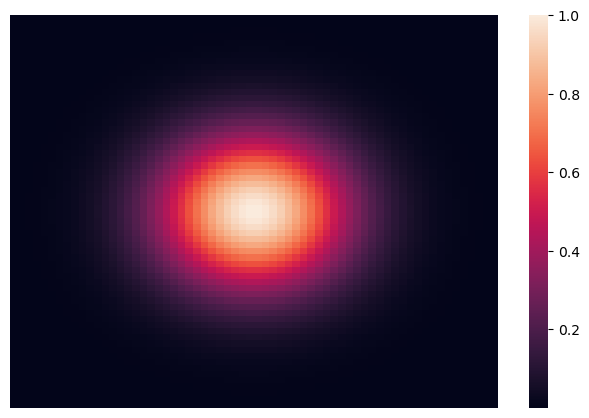

In [22]:

C,nx,nt=read("advection2D_gausian")
print("end of reaading")
nx=int(np.sqrt(nx))

arr=np.zeros((nt,nx,nx))
for t in range(nt):
    for y in range(nx):
        for x in range(nx):
            arr[t][y][x]=C[t*nx*nx+y*nx+x]

t=np.linspace(0,1,nt)
x=np.linspace(0,1,nx)
y=np.linspace(0,1,nx)

anim = animateAdvection(arr, x,y, t)
HTML(anim.to_jshtml())

In [23]:
sum_exact=sum_(arr[0])
for j in range(len(arr)):
    print(sum_(arr[j])-sum_exact) 


0.0
-0.060482571133206875
-0.12071992235951257
-0.18079953768392443
-0.24074409031391042
-0.30057769200766415
-0.3603146993432347
-0.4199749206127308
-0.4795740072077024
-0.539123947959979
-0.5986387210623434
-0.6581291657075781
-0.7176033516984717
-0.7770681866395535
-0.8365287693827668
-0.895999195143304
-0.9554777582952738
-1.0149714310173295
-1.0744859528558663
-1.1340225425415156
-1.193588829870805
-1.2531813447467357
-1.3128035548893422
-1.3724592076173394
-1.432142224106883
-1.4918603806117972
-1.5516188787223655
-1.6114106733393783
-1.6712404752493057
-1.731100529993455
-1.791001981743193
-1.8509366761691126
-1.9109085588761445
-1.9709140361856043
-2.0309558979211033
-2.0910292858393404
-2.1511377395327145
-2.2112818535401857
-2.2714560177405474
-2.3316632151595513
-2.3918992146768687
-2.452164838270164
-2.5124572107383756
-2.5727818128375475
-2.6331274031549583
-2.693501322722568
-2.7539015254465085
-2.814326005825478
-2.874769954524254
-2.9352407739529554
-2.995730591722804
-

## Поле скорости



end of reaading
[[ 0.02373781  0.0251508   0.02663118 ...  0.0510051   0.04872997
   0.04649998]
 [ 0.02448544  0.02596788  0.02752328 ...  0.05342926  0.05098918
   0.04860166]
 [ 0.02522213  0.02677536  0.02840746 ...  0.05591683  0.05330141
   0.05074697]
 ...
 [-0.03130472 -0.03368367 -0.03623661 ... -0.08806036 -0.08236068
  -0.07696292]
 [-0.0311975  -0.03353093 -0.03603056 ... -0.08591071 -0.08049791
  -0.07535619]
 [-0.03099998 -0.03328157 -0.03572132 ... -0.08359765 -0.07847007
  -0.07358492]]


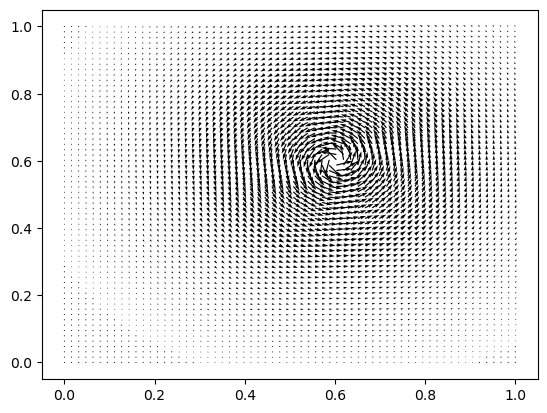

In [30]:

C,nx,nt=read("advection2D_velosity_field")
print("end of reaading")
nx=int(np.sqrt(nx))

arr=np.zeros((nt,nx,nx))
for t in range(nt):
    for y in range(nx):
        for x in range(nx):
            arr[t][y][x]=C[t*nx*nx+y*nx+x]


x=np.linspace(0,1,nx)
y=np.linspace(0,1,nx)

X, Y = np.meshgrid(x, y)
plt.quiver(X, Y, arr[0],arr[1])
print(arr[0])